<a href="https://colab.research.google.com/github/Dbms084/chest-xray-pneumonia-detection/blob/main/added_new_features.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import files
files.upload()

Saving kaggle.json.txt to kaggle.json.txt


{'kaggle.json.txt': b'{\r\n  "username": "debosmitamajumdar08",\r\n  "key": "KGAT_45ea354af47028cc6087d5dc8932b25b"\r\n}\r\n'}

# Baseline CNN for Pneumonia Detection

**Objective:**  
To build and understand a baseline convolutional neural network for classifying chest X-ray images.


In [2]:
!mv "kaggle.json.txt" kaggle.json

In [3]:
!ls

kaggle.json  sample_data


In [4]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


In [5]:
!kaggle datasets list


ref                                                   title                                           size  lastUpdated                 downloadCount  voteCount  usabilityRating  
----------------------------------------------------  ----------------------------------------  ----------  --------------------------  -------------  ---------  ---------------  
neurocipher/heartdisease                              Heart Disease                                   3491  2025-12-11 15:29:14.327000           2114        130  1.0              
wardabilal/spotify-global-music-dataset-20092025      Spotify Global Music Dataset (2009–2025)     1289021  2025-11-11 09:43:05.933000          16387        463  1.0              
neurocipher/student-performance                       Student Performance                            49705  2025-12-12 12:06:28.973000           1261         93  1.0              
suvidyasonawane/student-performance-dataset           Student Performance Dataset                   

In [6]:
!kaggle datasets download -d paultimothymooney/chest-xray-pneumonia
!unzip chest-xray-pneumonia.zip


Streaming output truncated to the last 5000 lines.
  inflating: chest_xray/train/NORMAL/IM-0435-0001-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0435-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0437-0001-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0437-0001-0002.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0437-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0438-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0439-0001-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0439-0001-0002.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0439-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0440-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0441-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0442-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0444-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0445-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0446-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0447-0001.jpeg  
  inflating:

In [7]:
import tensorflow as tf
import numpy as np
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import Sequential
import matplotlib.pyplot as plt

In [8]:
import PIL
from PIL import Image
import os

In [9]:
base_dir = "/content/chest_xray/chest_xray"

In [ ]:
normal_dir = os.path.join(base_dir,"train/NORMAL")
pneumonia_dir = os.path.join(base_dir,"train/PNEUMONIA")

In [ ]:
print("Normal images: ",len(os.listdir(normal_dir)))
print("Pneumonia images: ",len(os.listdir(pneumonia_dir))) #more number of pneumonia images

Normal images:  1342
Pneumonia images:  3876


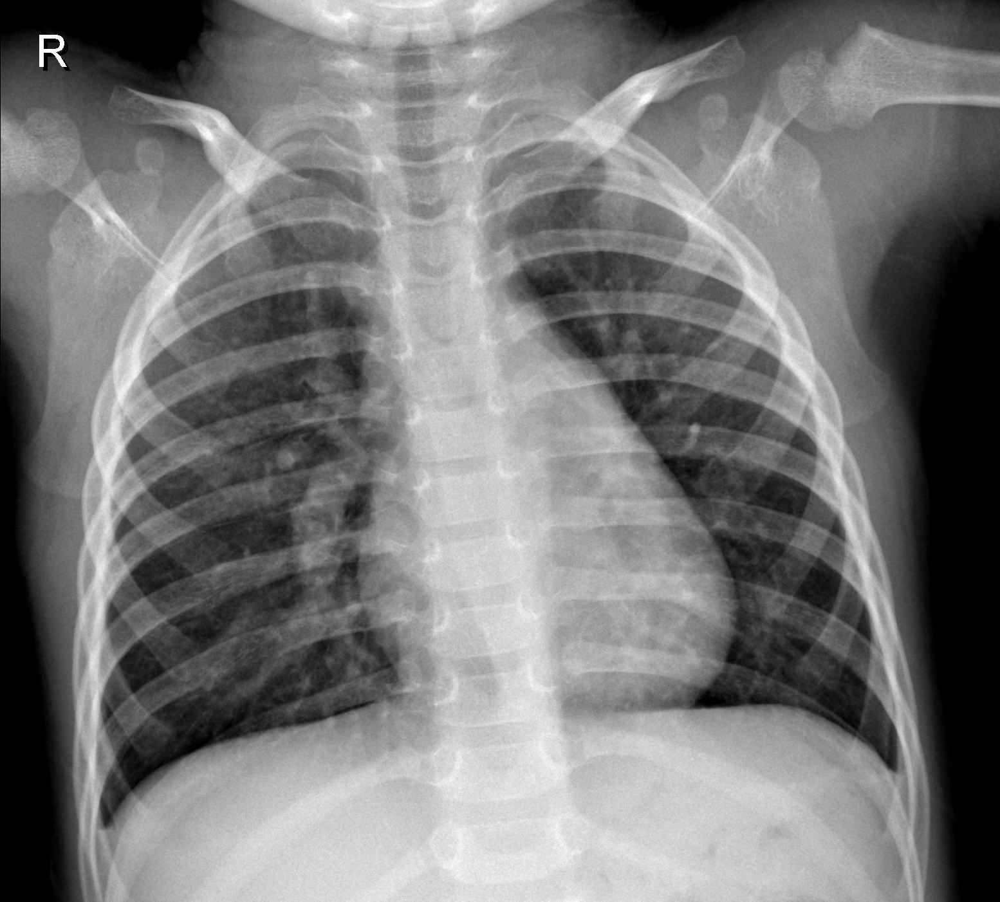

In [ ]:
normal_image_path = os.path.join(normal_dir,os.listdir(normal_dir)[0])
normal_img = Image.open(normal_image_path)
normal_img


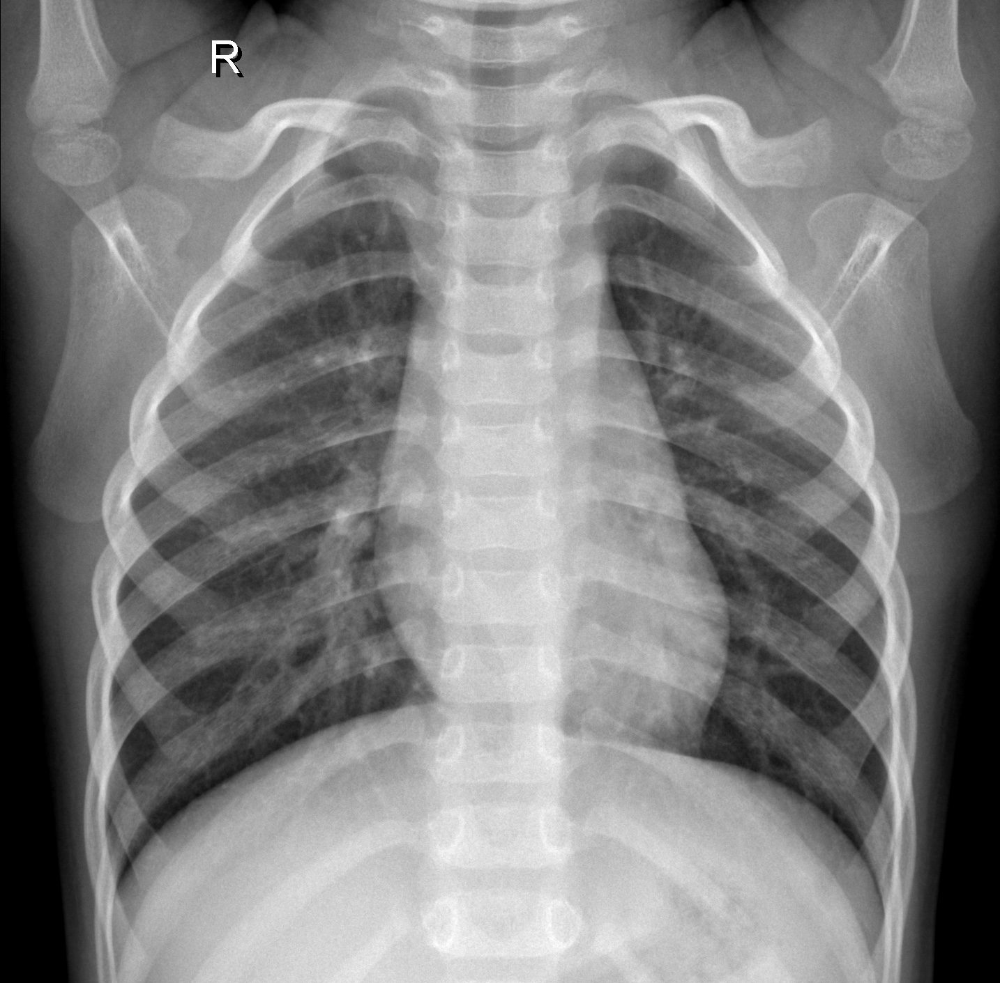

In [ ]:
normal_image_path = os.path.join(normal_dir,os.listdir(normal_dir)[1])
normal_img = Image.open(normal_image_path)
normal_img

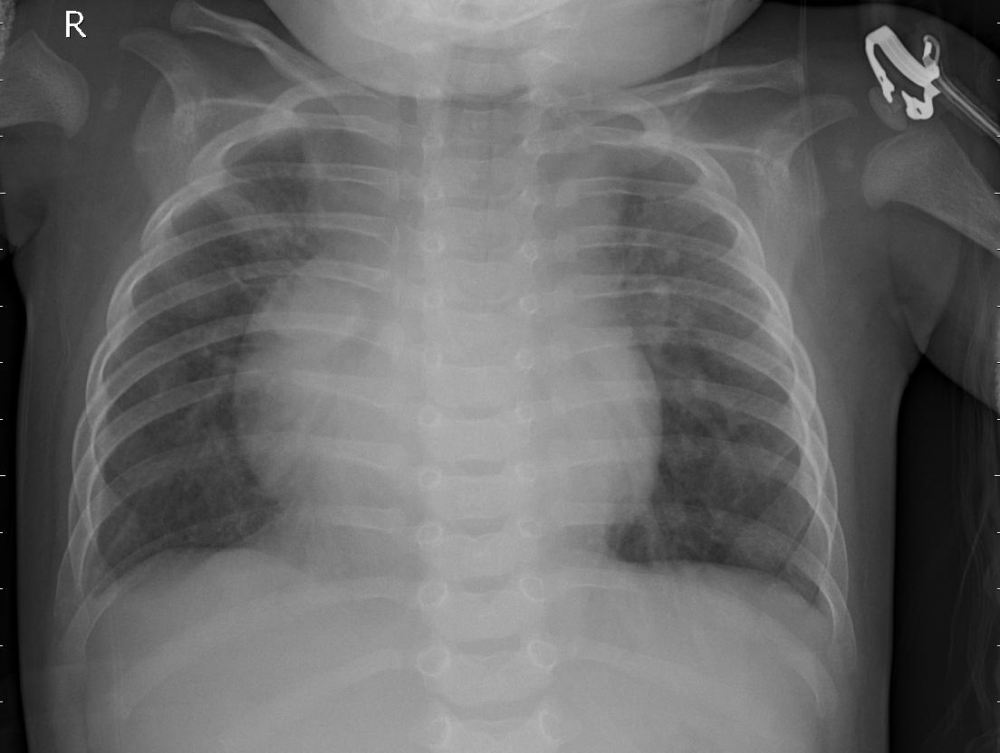

In [ ]:
pneumonia_image_path = os.path.join(pneumonia_dir,os.listdir(pneumonia_dir)[0])
pneumonia_img = Image.open(pneumonia_image_path)
pneumonia_img

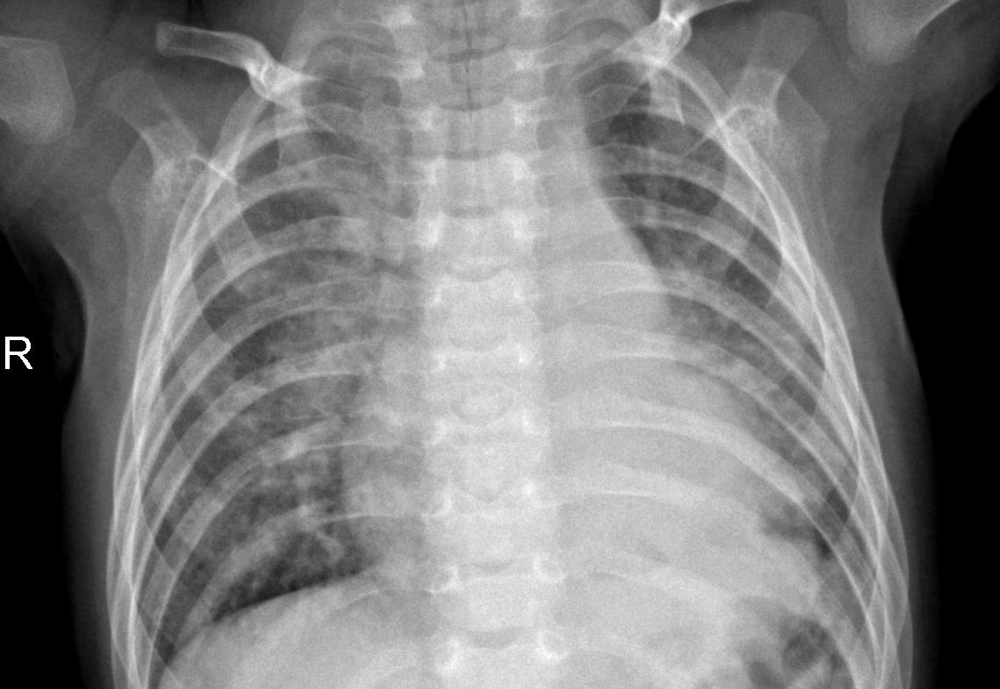

In [ ]:
pneumonia_image_path = os.path.join(pneumonia_dir,os.listdir(pneumonia_dir)[1])
pneumonia_img = Image.open(pneumonia_image_path)
pneumonia_img

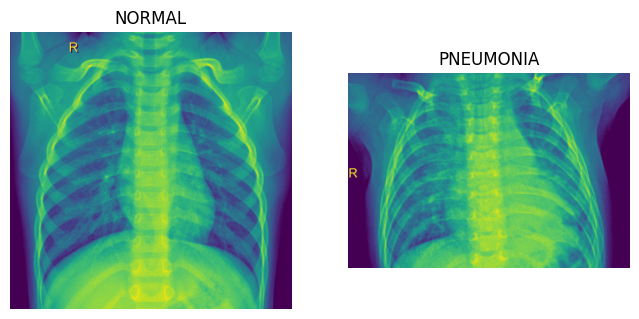

In [ ]:
plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
plt.imshow(normal_img)
plt.title("NORMAL")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(pneumonia_img)
plt.title("PNEUMONIA")
plt.axis("off")
plt.show()

In [ ]:
print("Normal image size:", normal_img.size)
print("Pneumonia image size:", pneumonia_img.size)
print("Image mode:", normal_img.mode)


Normal image size: (1434, 1411)
Pneumonia image size: (1140, 786)
Image mode: L


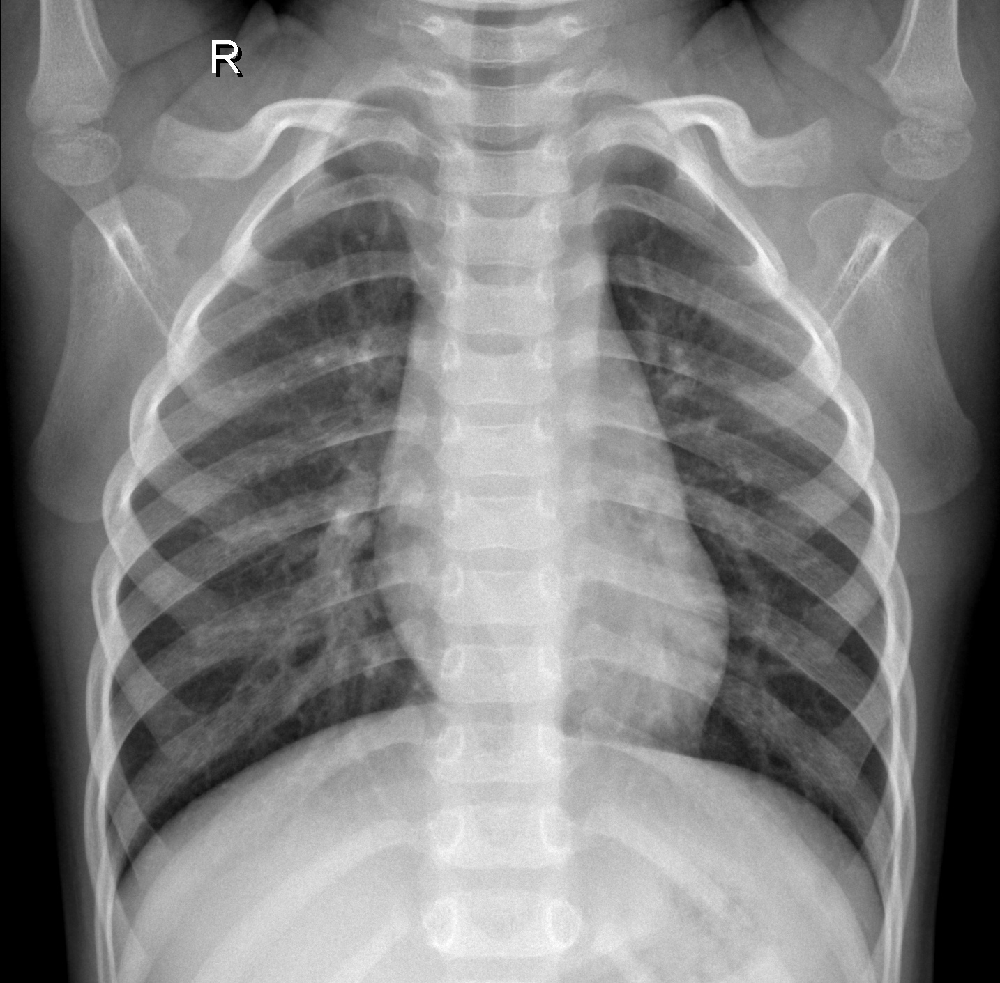

In [ ]:
normal_img_rgb = normal_img.convert("RGB")
normal_img_rgb

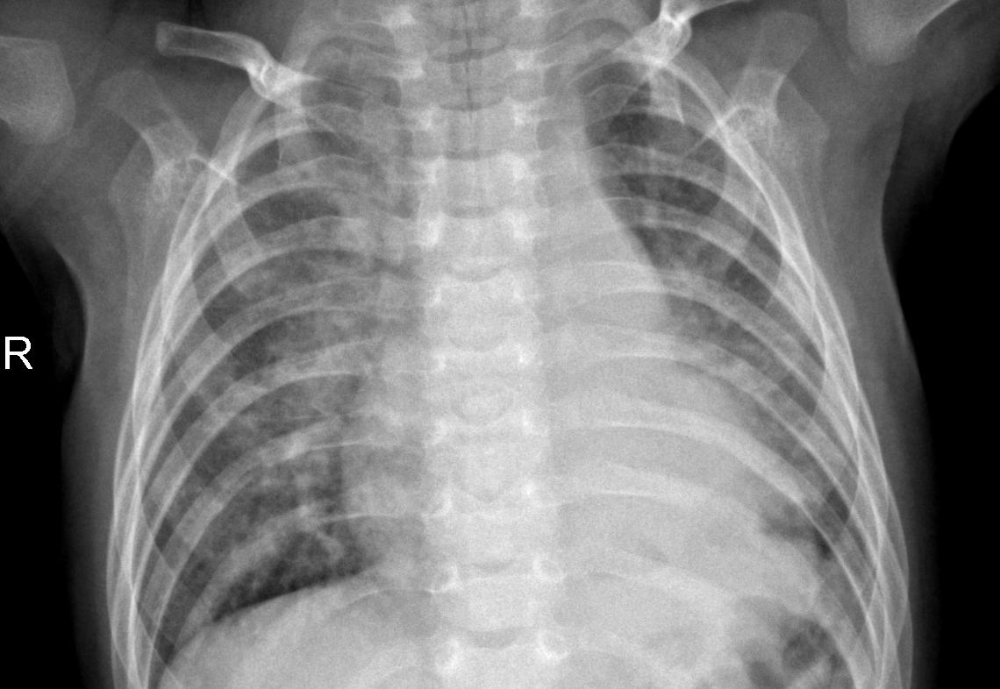

In [ ]:
pneumonia_img_rgb = pneumonia_img.convert("RGB")
pneumonia_img_rgb

## Define dataset paths

In [10]:
data_dir = "/content/chest_xray/chest_xray"
train_dir = os.path.join(data_dir,"train")
test_dir = os.path.join(data_dir,"test")
val_dir = os.path.join(data_dir,"val")

In [ ]:
!ls "/content/chest_xray/chest_xray"

test  train  val


In [12]:
img_height=180
img_width=180
batch_size=32

Load training dataset


In [13]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    image_size=(img_height,img_width),
    batch_size=batch_size
)

Found 5216 files belonging to 2 classes.


Load validation dataset

In [14]:

val_ds = tf.keras.utils.image_dataset_from_directory(
    val_dir,
    image_size=(img_height,img_width),
    batch_size=batch_size
)

Found 16 files belonging to 2 classes.


In [15]:
class_names = train_ds.class_names
print(class_names)

['NORMAL', 'PNEUMONIA']


In [ ]:
for images, labels in train_ds.take(1):
    print("Image batch shape:", images.shape)
    print("Label batch shape:", labels.shape)
    print("Labels:", labels.numpy())


Image batch shape: (32, 180, 180, 3)
Label batch shape: (32,)
Labels: [1 0 1 1 1 0 1 1 1 1 0 0 1 1 1 1 1 1 1 1 0 0 1 1 1 1 0 1 0 0 1 1]


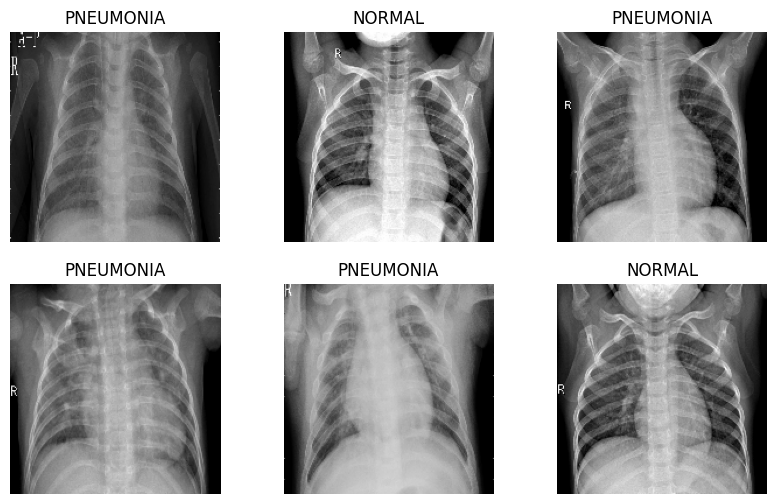

In [ ]:
plt.figure(figsize=(10,6))
for i in range(6):
    plt.subplot(2,3,i+1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")
plt.show()


# Improve data pipeline

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)


Build the baseline CNN

In [ ]:
from tensorflow.keras import models

In [ ]:
num_classes = len(class_names)
model = models.Sequential([
    layers.Rescaling(1./255,input_shape=(img_height,img_width,3)),
    layers.Conv2D(16,3,padding='same',activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32,3,padding='same',activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64,3,padding='same',activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128,activation='relu'),
    layers.Dense(num_classes)

])

/usr/local/lib/python3.12/dist-packages/keras/src/layers/preprocessing/tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_1 (Rescaling)         │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 180, 180, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 90, 90, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 90, 90, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 45, 45, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 45, 45, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 22, 22, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 30976)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │     3,965,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 2)              │           258 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,988,898 (15.22 MB)

 Trainable params: 3,988,898 (15.22 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy']
)

In [ ]:
epochs = 10
history=model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs
)

Epoch 1/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 35s 181ms/step - accuracy: 0.8668 - loss: 0.3208 - val_accuracy: 0.8125 - val_loss: 0.3371
Epoch 2/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 30s 183ms/step - accuracy: 0.9553 - loss: 0.1104 - val_accuracy: 0.9375 - val_loss: 0.1712
Epoch 3/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 29s 180ms/step - accuracy: 0.9776 - loss: 0.0733 - val_accuracy: 1.0000 - val_loss: 0.0729
Epoch 4/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 42s 186ms/step - accuracy: 0.9768 - loss: 0.0702 - val_accuracy: 1.0000 - val_loss: 0.1004
Epoch 5/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 40s 179ms/step - accuracy: 0.9813 - loss: 0.0532 - val_accuracy: 0.9375 - val_loss: 0.2057
Epoch 6/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 29s 178ms/step - accuracy: 0.9853 - loss: 0.0609 - val_accuracy: 1.0000 - val_loss: 0.0081
Epoch 7/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 30s 185ms/step - accuracy: 0.9903 - loss: 0.0230 - val_accuracy: 1.0000 - val_loss: 0.0045
Epoch 8/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 29s 178ms/step - accuracy: 0.9941 - loss: 0

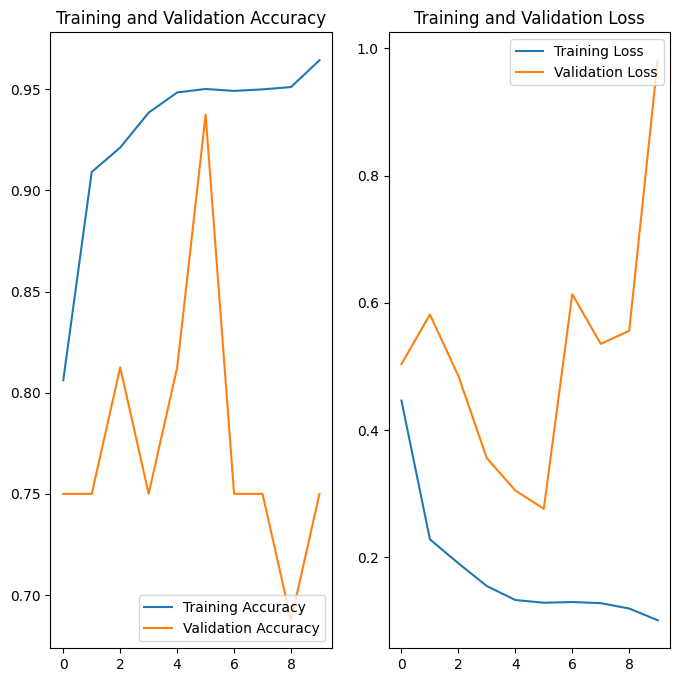

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

Evaluate on test set

In [16]:
test_dir = "/content/chest_xray/test"
test_ds = tf.keras.utils.image_dataset_from_directory(
    test_dir,
    image_size=(img_height,img_width),
    batch_size=batch_size
)

Found 624 files belonging to 2 classes.


In [ ]:
import numpy as np
y_true = []
y_pred = []
for images,labels in test_ds:
  logits = model.predict(images)
  preds = np.argmax(logits,axis=1)
  y_true.extend(labels.numpy())
  y_pred.extend(preds)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 911ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


In [ ]:
test_loss, test_accuracy = model.evaluate(test_ds)
print(test_loss, test_accuracy)


20/20 ━━━━━━━━━━━━━━━━━━━━ 6s 238ms/step - accuracy: 0.7150 - loss: 2.3861
2.3698179721832275 0.7195512652397156


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report

print(confusion_matrix(y_true, y_pred))
print(classification_report(y_true, y_pred, target_names=class_names))


[[ 61 173]
 [  2 388]]
              precision    recall  f1-score   support

      NORMAL       0.97      0.26      0.41       234
   PNEUMONIA       0.69      0.99      0.82       390

    accuracy                           0.72       624
   macro avg       0.83      0.63      0.61       624
weighted avg       0.80      0.72      0.66       624



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


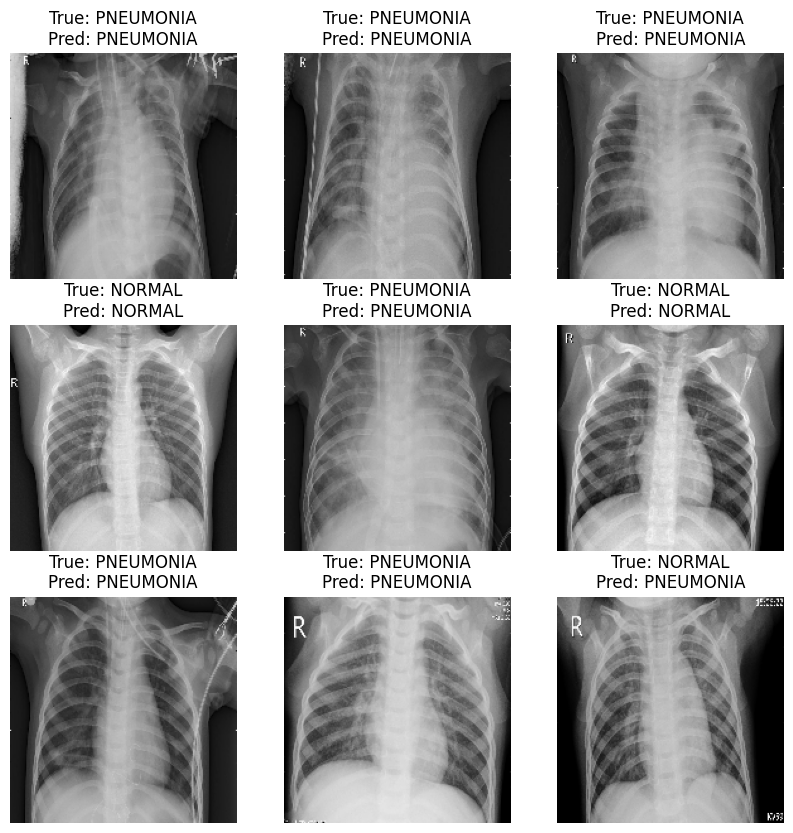

In [ ]:
image_batch, label_batch = next(iter(test_ds))
logits = model.predict(image_batch)
pred_labels = np.argmax(logits, axis=1)

plt.figure(figsize=(10,10))
for i in range(9):
    plt.subplot(3,3,i+1)
    plt.imshow(image_batch[i].numpy().astype("uint8"))
    plt.title(
        f"True: {class_names[label_batch[i]]}\n"
        f"Pred: {class_names[pred_labels[i]]}"
    )
    plt.axis("off")
plt.show()


In [ ]:
model.save("baseline_cnn.keras")

##“The baseline CNN achieves very high recall for pneumonia detection but shows low recall for normal cases, indicating a bias toward predicting pneumonia. This behavior minimizes false negatives at the cost of increased false positives, which is acceptable for a screening-oriented medical application.”

Data augmentation

In [19]:
data_augmentation = keras.Sequential(
    [
        layers.RandomFlip("horizonal",input_shape=(img_height,img_width,3)),
        layers.RandomRotation(0.1),
        layers.RandomZoom(0.1)
    ]
)

/usr/local/lib/python3.12/dist-packages/keras/src/layers/preprocessing/tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


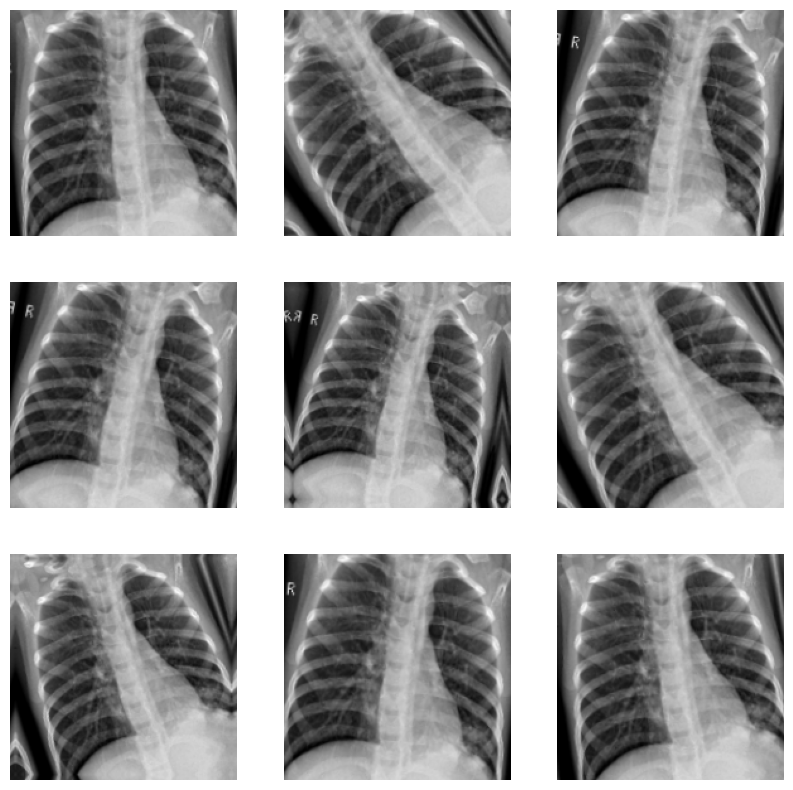

In [20]:
plt.figure(figsize=(10, 10))
for images, _ in train_ds.take(1):
  for i in range(9):
    augmented_images = data_augmentation(images)
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(augmented_images[0].numpy().astype("uint8"))
    plt.axis("off")

In [22]:
num_classes=len(class_names)

# Add dropout layer

In [23]:
model = Sequential([
  data_augmentation,
  layers.Rescaling(1./255,input_shape=(img_height,img_width,3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout(0.2),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes, name="outputs")
])

In [24]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy']
)

In [25]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_1 (Rescaling)         │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 180, 180, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 90, 90, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 90, 90, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 45, 45, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 45, 45, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 22, 22, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 22, 22, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 30976)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │     3,965,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ outputs (Dense)                 │ (None, 2)              │           258 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,988,898 (15.22 MB)

 Trainable params: 3,988,898 (15.22 MB)

 Non-trainable params: 0 (0.00 B)

In [26]:
epochs = 10
history=model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs
)

Epoch 1/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 36s 182ms/step - accuracy: 0.7480 - loss: 0.5801 - val_accuracy: 0.6875 - val_loss: 0.6904
Epoch 2/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 30s 182ms/step - accuracy: 0.8870 - loss: 0.2667 - val_accuracy: 0.7500 - val_loss: 0.5134
Epoch 3/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 31s 191ms/step - accuracy: 0.9016 - loss: 0.2412 - val_accuracy: 0.7500 - val_loss: 0.5463
Epoch 4/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 39s 181ms/step - accuracy: 0.9261 - loss: 0.1861 - val_accuracy: 0.9375 - val_loss: 0.3785
Epoch 5/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 42s 186ms/step - accuracy: 0.9303 - loss: 0.1711 - val_accuracy: 0.8750 - val_loss: 0.2539
Epoch 6/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 41s 186ms/step - accuracy: 0.9333 - loss: 0.1665 - val_accuracy: 0.8750 - val_loss: 0.2679
Epoch 7/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 30s 183ms/step - accuracy: 0.9448 - loss: 0.1454 - val_accuracy: 0.8125 - val_loss: 0.3239
Epoch 8/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 31s 189ms/step - accuracy: 0.9524 - loss: 0

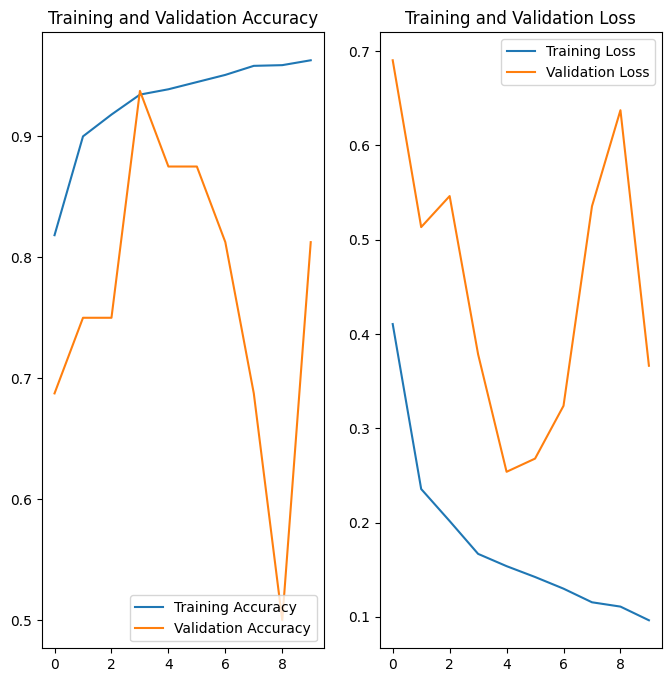

In [27]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [28]:
import numpy as np
y_true = []
y_pred = []
for images,labels in test_ds:
  logits = model.predict(images)
  preds = np.argmax(logits,axis=1)
  y_true.extend(labels.numpy())
  y_pred.extend(preds)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 588ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


In [29]:
from sklearn.metrics import confusion_matrix, classification_report

print(confusion_matrix(y_true, y_pred))
print(classification_report(y_true, y_pred, target_names=class_names))


[[162  72]
 [ 10 380]]
              precision    recall  f1-score   support

      NORMAL       0.94      0.69      0.80       234
   PNEUMONIA       0.84      0.97      0.90       390

    accuracy                           0.87       624
   macro avg       0.89      0.83      0.85       624
weighted avg       0.88      0.87      0.86       624



In [30]:
test_loss, test_accuracy = model.evaluate(test_ds)

print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")


20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 136ms/step - accuracy: 0.8737 - loss: 0.3373
Test Loss: 0.3394
Test Accuracy: 0.8686


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


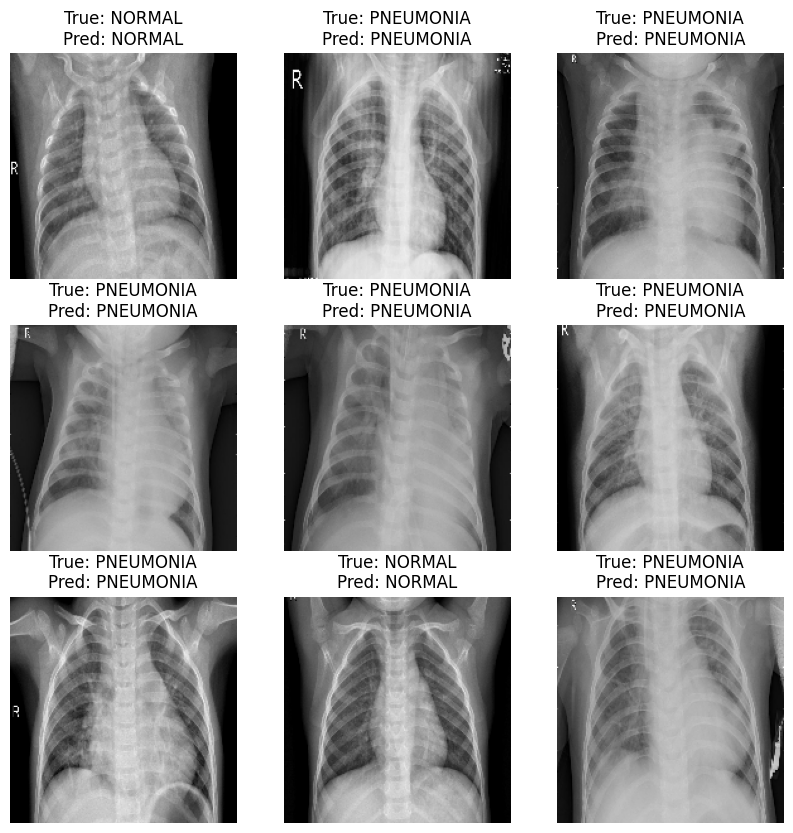

In [31]:
image_batch, label_batch = next(iter(test_ds))
logits = model.predict(image_batch)
pred_labels = np.argmax(logits, axis=1)

plt.figure(figsize=(10,10))
for i in range(9):
    plt.subplot(3,3,i+1)
    plt.imshow(image_batch[i].numpy().astype("uint8"))
    plt.title(
        f"True: {class_names[label_batch[i]]}\n"
        f"Pred: {class_names[pred_labels[i]]}"
    )
    plt.axis("off")
plt.show()


In [34]:
from google.colab import drive
drive.mount('/content/drive')
model.save('/content/drive/MyDrive/regularized_cnn.keras')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [35]:
model.save("regularized_cnn.keras")

“Regularization through data augmentation and dropout significantly improved generalization, especially for the minority class (NORMAL), while maintaining high sensitivity for pneumonia detection.”

## Transfer learning with MobileNetV2

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers,models
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

In [ ]:
print(train_ds)

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 180, 180, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>


In [ ]:
print(val_ds)

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 180, 180, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>


In [ ]:
print(test_ds)

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 180, 180, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>


In [ ]:
# mobilenetv2 preprocessing
data_preprocessing = tf.keras.Sequential([
    layers.Resizing(224,224),
    layers.Lambda(preprocess_input)
])

In [ ]:
# load pretrained mobilenetv2(frozen)
base_model = MobileNetV2(
    input_shape=(224,224,3),
    include_top=False,
    weights='imagenet'
)

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
base_model.trainable=False # freeze the model

In [ ]:
base_model.summary()

Model: "mobilenetv2_1.00_224"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 2,257,984 (8.61 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
global_avg_pool = layers.GlobalAveragePooling2D()
dropout = layers.Dropout(0.5)
prediction_layer = layers.Dense(1,activation='sigmoid')


In [ ]:
inputs = tf.keras.Input(shape=(img_height,img_width,3))
x = data_preprocessing(inputs)
x = base_model(x,training=False)
x = global_avg_pool(x)
x = dropout(x)
outputs = prediction_layer(x)
model_tl = tf.keras.Model(inputs,outputs)

In [ ]:
model_tl.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential (Sequential)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │         1,281 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,259,265 (8.62 MB)

 Trainable params: 1,281 (5.00 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
len(model_tl.trainable_variables)

2

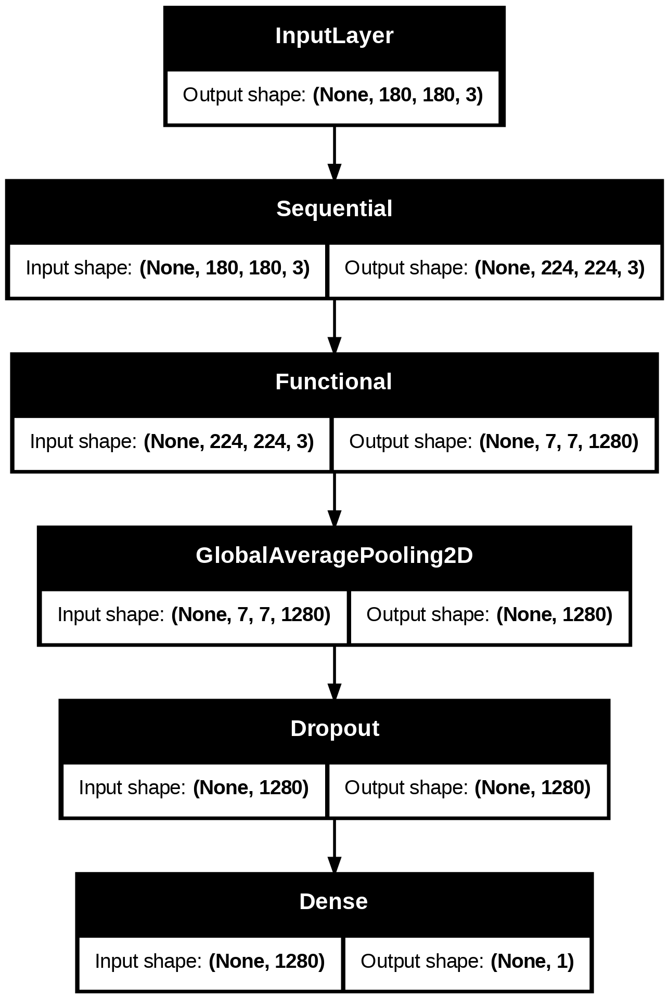

In [ ]:
tf.keras.utils.plot_model(model_tl,show_shapes=True)

In [ ]:
model_tl.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss=tf.keras.losses.BinaryCrossentropy(),
    metrics=['accuracy']
)

In [ ]:
# Train(feature extraction only)
epochs = 5
history_tl = model_tl.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs
)

Epoch 1/5
163/163 ━━━━━━━━━━━━━━━━━━━━ 61s 251ms/step - accuracy: 0.7212 - loss: 0.5534 - val_accuracy: 0.5000 - val_loss: 0.6705
Epoch 2/5
163/163 ━━━━━━━━━━━━━━━━━━━━ 30s 184ms/step - accuracy: 0.7949 - loss: 0.4271 - val_accuracy: 0.5625 - val_loss: 0.5421
Epoch 3/5
163/163 ━━━━━━━━━━━━━━━━━━━━ 41s 184ms/step - accuracy: 0.8474 - loss: 0.3387 - val_accuracy: 0.7500 - val_loss: 0.4751
Epoch 4/5
163/163 ━━━━━━━━━━━━━━━━━━━━ 41s 184ms/step - accuracy: 0.8698 - loss: 0.3062 - val_accuracy: 0.7500 - val_loss: 0.4317
Epoch 5/5
163/163 ━━━━━━━━━━━━━━━━━━━━ 42s 188ms/step - accuracy: 0.9036 - loss: 0.2451 - val_accuracy: 0.7500 - val_loss: 0.4132


In [ ]:
acc = history_tl.history['accuracy']
val_acc = history_tl.history['val_accuracy']

loss = history_tl.history['loss']
val_loss = history_tl.history['val_loss']

epochs_range = range(len(acc))


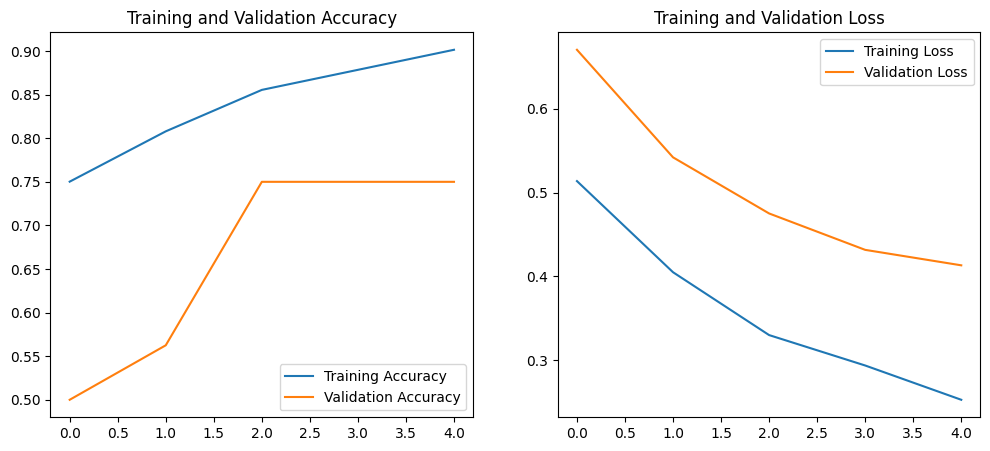

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')

plt.show()


In [ ]:
import numpy as np

y_true = []
y_pred = []

for images, labels in test_ds:
    probs = model_tl.predict(images)
    preds = (probs > 0.5).astype(int).flatten()

    y_true.extend(labels.numpy())
    y_pred.extend(preds)


1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report

print(confusion_matrix(y_true, y_pred))
print(classification_report(y_true, y_pred, target_names=class_names))


[[100 134]
 [  3 387]]
              precision    recall  f1-score   support

      NORMAL       0.97      0.43      0.59       234
   PNEUMONIA       0.74      0.99      0.85       390

    accuracy                           0.78       624
   macro avg       0.86      0.71      0.72       624
weighted avg       0.83      0.78      0.75       624



#“Using MobileNetV2 as a fixed feature extractor improved stability and reduced overfitting compared to the baseline CNN. However, performance remained below the regularized custom CNN, indicating that domain adaptation through fine-tuning is required.”

In [ ]:
# MobileNetV2 has 155 layers
# we will unfreeze the top -25 layers only
base_model.trainable = True
fine_tune_at = len(base_model.layers) - 25
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False
#

In [ ]:
print("Total layers:", len(base_model.layers))
print("Trainable layers:", sum([layer.trainable for layer in base_model.layers]))


Total layers: 154
Trainable layers: 25


In [ ]:
model_tl.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
    loss='binary_crossentropy',
    metrics=['accuracy']
)


In [ ]:
fine_tune_epochs = 5

history_fine = model_tl.fit(
    train_ds,
    validation_data=val_ds,
    epochs=fine_tune_epochs
)


Epoch 1/5
163/163 ━━━━━━━━━━━━━━━━━━━━ 51s 211ms/step - accuracy: 0.8629 - loss: 0.3135 - val_accuracy: 0.7500 - val_loss: 0.3432
Epoch 2/5
163/163 ━━━━━━━━━━━━━━━━━━━━ 30s 187ms/step - accuracy: 0.9520 - loss: 0.1430 - val_accuracy: 0.8125 - val_loss: 0.3421
Epoch 3/5
163/163 ━━━━━━━━━━━━━━━━━━━━ 40s 182ms/step - accuracy: 0.9583 - loss: 0.1182 - val_accuracy: 0.8125 - val_loss: 0.3905
Epoch 4/5
163/163 ━━━━━━━━━━━━━━━━━━━━ 41s 183ms/step - accuracy: 0.9707 - loss: 0.0900 - val_accuracy: 0.8125 - val_loss: 0.3907
Epoch 5/5
163/163 ━━━━━━━━━━━━━━━━━━━━ 31s 189ms/step - accuracy: 0.9778 - loss: 0.0712 - val_accuracy: 0.8125 - val_loss: 0.3818


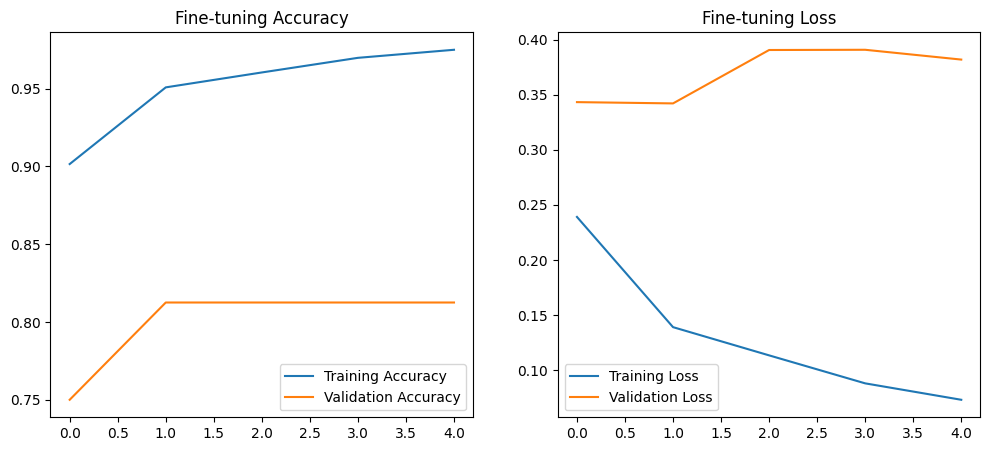

In [ ]:
acc = history_fine.history['accuracy']
val_acc = history_fine.history['val_accuracy']

loss = history_fine.history['loss']
val_loss = history_fine.history['val_loss']

epochs_range = range(len(acc))

import matplotlib.pyplot as plt
plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Fine-tuning Accuracy')

plt.subplot(1,2,2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Fine-tuning Loss')

plt.show()


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import numpy as np

y_true = []
y_pred = []

for images, labels in test_ds:
    probs = model_tl.predict(images)
    preds = (probs > 0.5).astype(int).flatten()

    y_true.extend(labels.numpy())
    y_pred.extend(preds)

print(confusion_matrix(y_true, y_pred))
print(classification_report(y_true, y_pred, target_names=class_names))


1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
[[125 109]
 [  1 389]]
              precision    recall  f1-score   support

      NORMAL       0.99      0.53      0.69       234
   PNEUMONIA       0.78      1.00      0.88       390

    accuracy                           0.82

In [ ]:
test_loss , test_accuracy = model_tl.evaluate(test_ds)
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

20/20 ━━━━━━━━━━━━━━━━━━━━ 8s 121ms/step - accuracy: 0.8219 - loss: 0.4885
Test Loss: 0.4884
Test Accuracy: 0.8237


In [ ]:
# test the model on individual images(tutorial style)
import matplotlib.pyplot as plt
import numpy as np
image_batch,label_batch = next(iter(test_ds))
predictions = model_tl.predict(image_batch)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


In [ ]:
pred_labels = (predictions>0.5).astype(int).flatten()

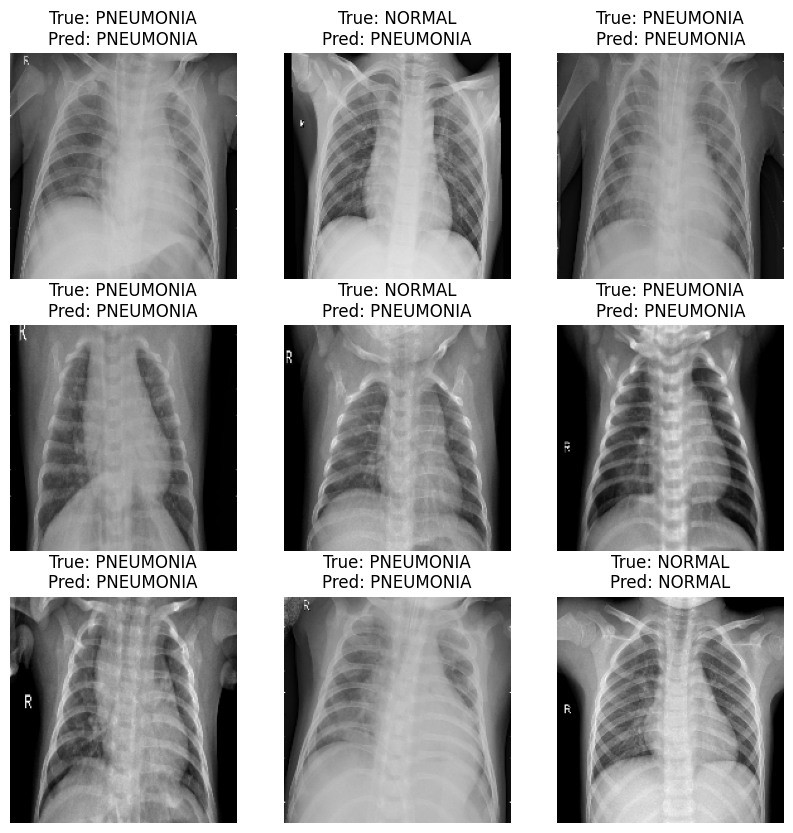

In [ ]:
plt.figure(figsize=(10, 10))

for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.imshow(image_batch[i].numpy().astype("uint8"))
    true_label = class_names[label_batch[i]]
    pred_label = class_names[pred_labels[i]]
    plt.title(f"True: {true_label}\nPred: {pred_label}")
    plt.axis("off")

plt.show()


“The model occasionally predicts normal chest X-rays as pneumonia. This behavior reflects a deliberate bias toward high sensitivity, ensuring that pneumonia cases are rarely missed. In a screening-oriented application, such false positives are preferable to false negatives and can be resolved through further clinical review.”

# Starting with DenseNet121 to improve the normal recall while maintainin the pneumonia senstivity

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers,models
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.applications.densenet import preprocess_input

In [ ]:
print(train_ds)

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 180, 180, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>


In [ ]:
print(val_ds)
print(test_ds)

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 180, 180, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 180, 180, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>


In [ ]:
# Densenet preprocessing block
data_preprocessing = tf.keras.Sequential([
    layers.Resizing(224,224),
    layers.Lambda(preprocess_input)
])

In [ ]:
# Load densenet121 (frozen)
base_model = DenseNet121(
    include_top=False,
    weights="imagenet",
    input_shape=(224, 224, 3)
)

base_model.trainable = False


29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
base_model.summary()

Model: "densenet121"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 7,037,504 (26.85 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 7,037,504 (26.85 MB)

In [ ]:
# build classifier head
# densenet works best with global average pooling
global_avg_pool = layers.GlobalAveragePooling2D()
dropout = layers.Dropout(0.5)
prediction_layer = layers.Dense(1, activation="sigmoid")


In [ ]:
# assemble the full model
inputs = tf.keras.Input(shape=(img_height, img_width, 3))
x = data_preprocessing(inputs)
x = base_model(x, training=False)
x = global_avg_pool(x)
x = dropout(x)
outputs = prediction_layer(x)

model_dn = tf.keras.Model(inputs, outputs)


In [ ]:
model_dn.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential (Sequential)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ densenet121 (Functional)        │ (None, 7, 7, 1024)     │     7,037,504 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1024)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │         1,025 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,038,529 (26.85 MB)

 Trainable params: 1,025 (4.00 KB)

 Non-trainable params: 7,037,504 (26.85 MB)

In [ ]:
# compile (feature extraction phase)
model_dn.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss="binary_crossentropy",
    metrics=["accuracy"]
)


In [ ]:
# train(frozen densenet)
epochs = 5

history_dn = model_dn.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs
)


Epoch 1/5
163/163 ━━━━━━━━━━━━━━━━━━━━ 75s 281ms/step - accuracy: 0.6397 - loss: 0.7922 - val_accuracy: 0.5000 - val_loss: 0.8569
Epoch 2/5
163/163 ━━━━━━━━━━━━━━━━━━━━ 30s 184ms/step - accuracy: 0.7081 - loss: 0.6436 - val_accuracy: 0.5625 - val_loss: 0.7059
Epoch 3/5
163/163 ━━━━━━━━━━━━━━━━━━━━ 42s 192ms/step - accuracy: 0.7624 - loss: 0.5266 - val_accuracy: 0.6250 - val_loss: 0.6228
Epoch 4/5
163/163 ━━━━━━━━━━━━━━━━━━━━ 30s 184ms/step - accuracy: 0.7971 - loss: 0.4584 - val_accuracy: 0.6250 - val_loss: 0.5510
Epoch 5/5
163/163 ━━━━━━━━━━━━━━━━━━━━ 31s 190ms/step - accuracy: 0.8210 - loss: 0.3893 - val_accuracy: 0.6250 - val_loss: 0.5001


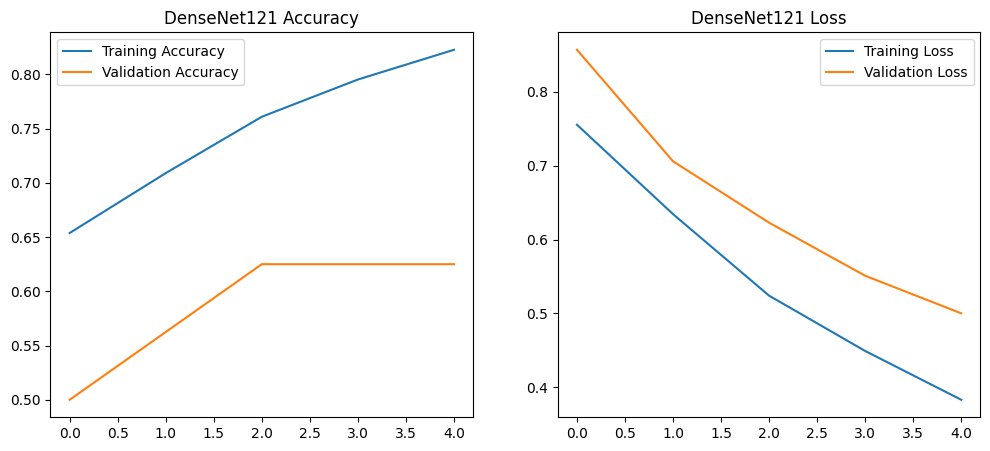

In [ ]:
acc = history_dn.history["accuracy"]
val_acc = history_dn.history["val_accuracy"]
loss = history_dn.history["loss"]
val_loss = history_dn.history["val_loss"]

epochs_range = range(len(acc))

import matplotlib.pyplot as plt
plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.plot(epochs_range, acc, label="Training Accuracy")
plt.plot(epochs_range, val_acc, label="Validation Accuracy")
plt.legend()
plt.title("DenseNet121 Accuracy")

plt.subplot(1,2,2)
plt.plot(epochs_range, loss, label="Training Loss")
plt.plot(epochs_range, val_loss, label="Validation Loss")
plt.legend()
plt.title("DenseNet121 Loss")

plt.show()


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import numpy as np

y_true = []
y_pred = []

for images, labels in test_ds:
    probs = model_dn.predict(images)
    preds = (probs > 0.5).astype(int).flatten()

    y_true.extend(labels.numpy())
    y_pred.extend(preds)

print(confusion_matrix(y_true, y_pred))
print(classification_report(y_true, y_pred, target_names=class_names))


1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 12s 12s/step
[[ 67 167]
 [  3 387]]
              precision    recall  f1-score   support

      NORMAL       0.96      0.29      0.44       234
   PNEUMONIA       0.70      0.99      0.82       390

    accuracy                       

“Despite experimenting with transfer learning using MobileNetV2 and DenseNet121, the regularized custom CNN achieved the best overall performance. This indicates that, for this dataset, domain-specific feature learning with appropriate regularization is more effective than transferring features learned from natural images.”

In [36]:
!ls

chest_xray		  drive        regularized_cnn.keras
chest-xray-pneumonia.zip  kaggle.json  sample_data


In [37]:
!ls /content/drive/MyDrive

 BRCCO_2021_5803309.pdf
 Classroom
'Colab Notebooks'
'Doc Scanner'
'Doc Scanner Upload'
'How to win friendsandinfluencepeople.pdf'
 regularized_cnn.keras
'Resume - Copy_D.docx'
'Resume - Copy_D.pdf'
'Screenshot_20230719-192458_Samsung Internet (1).jpg'
'Screenshot_20230719-192458_Samsung Internet (2).jpg'
'Screenshot_20230719-192458_Samsung Internet.jpg'
 Screenshot_20251216-092226_Chrome~2.png


In [38]:
from google.colab import drive
drive.mount("/content/drive")

regularized_model = tf.keras.models.load_model(
    "/content/drive/MyDrive/regularized_cnn.keras"
)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [39]:
regularized_model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_1 (Rescaling)         │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 180, 180, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 90, 90, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 90, 90, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 45, 45, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 45, 45, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 22, 22, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 22, 22, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 30976)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │     3,965,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ outputs (Dense)                 │ (None, 2)              │           258 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,966,696 (45.65 MB)

 Trainable params: 3,988,898 (15.22 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,977,798 (30.43 MB)

# I tried using grad-cam but because of data augmentation layer, it was not possible

In [79]:
print(class_names)

['NORMAL', 'PNEUMONIA']


In [80]:
import numpy as np

y_true = []
y_probs = []

for images, labels in test_ds:
    logits = regularized_model(images, training=False)
    probs = tf.nn.softmax(logits, axis=1)

    y_true.extend(labels.numpy())
    y_probs.extend(probs[:, 1].numpy())  # probability of PNEUMONIA

y_true = np.array(y_true)
y_probs = np.array(y_probs)


In [81]:
# define thresholds
from sklearn.metrics import classification_report

thresholds = [0.3, 0.5, 0.7]

for t in thresholds:
    y_pred = (y_probs >= t).astype(int)

    print(f"\n🔹 Threshold = {t}")
    print(classification_report(
        y_true,
        y_pred,
        target_names=class_names
    ))



🔹 Threshold = 0.3
              precision    recall  f1-score   support

      NORMAL       0.96      0.59      0.73       234
   PNEUMONIA       0.80      0.99      0.88       390

    accuracy                           0.84       624
   macro avg       0.88      0.79      0.81       624
weighted avg       0.86      0.84      0.83       624


🔹 Threshold = 0.5
              precision    recall  f1-score   support

      NORMAL       0.94      0.69      0.80       234
   PNEUMONIA       0.84      0.97      0.90       390

    accuracy                           0.87       624
   macro avg       0.89      0.83      0.85       624
weighted avg       0.88      0.87      0.86       624


🔹 Threshold = 0.7
              precision    recall  f1-score   support

      NORMAL       0.92      0.79      0.85       234
   PNEUMONIA       0.88      0.96      0.92       390

    accuracy                           0.89       624
   macro avg       0.90      0.87      0.88       624
weighted avg     

# “Threshold analysis revealed that increasing the decision threshold from 0.5 to 0.7 significantly reduced false positive pneumonia predictions while maintaining high sensitivity. Therefore, a threshold of 0.7 was selected as the final operating point for the model.”

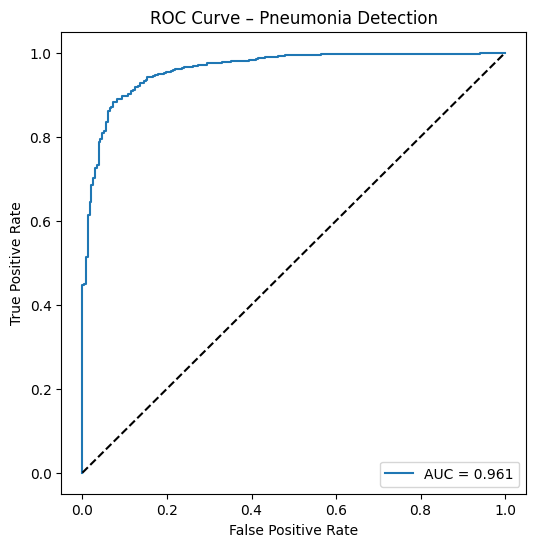

In [82]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

fpr, tpr, _ = roc_curve(y_true, y_probs)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6,6))
plt.plot(fpr, tpr, label=f"AUC = {roc_auc:.3f}")
plt.plot([0,1], [0,1], 'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve – Pneumonia Detection")
plt.legend()
plt.show()


# “The ROC curve illustrates the trade-off between sensitivity and false positive rate across different thresholds. The model achieves a high area under the curve (AUC), indicating strong discriminative capability between pneumonia and normal chest X-rays, independent of a fixed decision threshold.”

# “The ROC curve illustrates the trade-off between sensitivity and false positive rate across different thresholds. The model achieves a high area under the curve (AUC), indicating strong discriminative capability between pneumonia and normal chest X-rays, independent of a fixed decision threshold.”

In [83]:
# identify false positives & false negatives
y_pred_default = (y_probs >= 0.5).astype(int)

false_positives = np.where((y_true == 0) & (y_pred_default == 1))[0]
false_negatives = np.where((y_true == 1) & (y_pred_default == 0))[0]


IndexError: index 52 is out of bounds for axis 0 with size 32

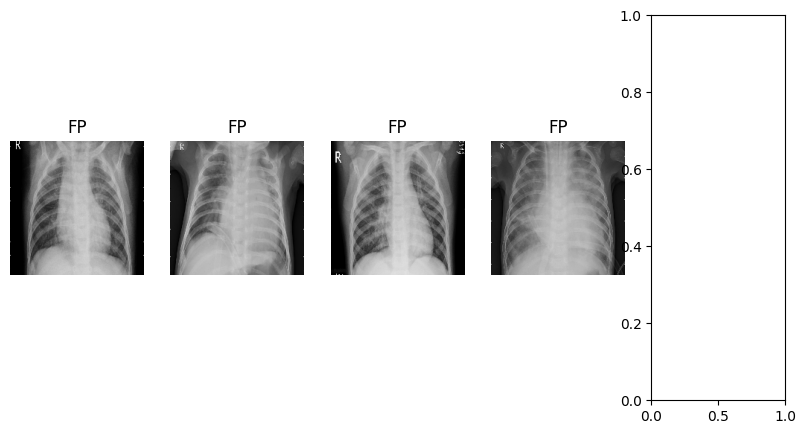

In [86]:
import matplotlib.pyplot as plt

image_batch, label_batch = next(iter(test_ds))
images = image_batch.numpy()
labels = label_batch.numpy()

plt.figure(figsize=(10,5))
for i, idx in enumerate(false_positives[:5]):
    plt.subplot(1,5,i+1)
    plt.imshow(images[idx].astype("uint8"))
    plt.title("FP")
    plt.axis("off")

plt.suptitle("False Positives: NORMAL → PNEUMONIA")
plt.show()


# “False positive cases often exhibit low contrast or diffuse lung textures, which resemble early-stage pneumonia. Such ambiguity can lead to conservative predictions by the model, prioritizing sensitivity over specificity.”